# Causal Learning
In this notebook, I will first create a causal graph that represet the causal relation between the variables in the data.
And then I will train a model on a selected subset of my variable. 
The specific steps will look like as follows:
1. Split data into training and hold-out set 
2. Create a causal graph using all training data and get the insights (this will be considered the ground truth)
3. Create new causal graphs using increasing fractions of the data and compare with the ground truth graph
   * The comparison can be done with a Jaccard Similarity Index, measuring the intersection and union of the graph edges
4. After reaching a stable causal graph, select only variables that point directly to the target variable
5. Train one model using all variables and another using only the variables selected by the graph
6. Measure how much each of the models overfit the hold-out set created in step 1.

# Import libraries

In [1]:
import sys
sys.path.append("../scripts/")

from sklearn.model_selection import train_test_split

# custom modules import
from fetch_data import DataLoader
from visualization import Plotters
from causal_graph import CausalGraph
from cleaning import CleanDataFrame
cleaner = CleanDataFrame()


# plotters = Plotters(w=10, h=10)

/home/hat/miniconda3/envs/causality/lib/python3.8/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# Load the data

In [2]:
loader = DataLoader()

struct_data = loader.dvc_get_data(path="./data/data.csv",
                                  version="cleaned_data",
                                  repo="../")


DVC: CSV file read with path: ./data/data.csv | version: cleaned_data | from: ../


# Step-1: Split into training and hold-out sets

In [3]:
train_set, holdout_set = train_test_split(struct_data, test_size=0.3, random_state=50)
print(f"Train set shape: {train_set.shape}\nHoldout set shape: {holdout_set.shape}")

Train set shape: (398, 31)
Holdout set shape: (171, 31)


From now on, I will be using the `train_set` dataframe.

In [4]:
# train_set.columns

# Step-2: Create a causal graph using all of the train_set

In [5]:
baseline_cg = CausalGraph(train_set)
# baseline_cg.learn_graph(w_threshold=0.8)
# Save graph
# baseline_cg.save_graph("baseline.dot")
baseline_cg.read_graph("baseline.dot")

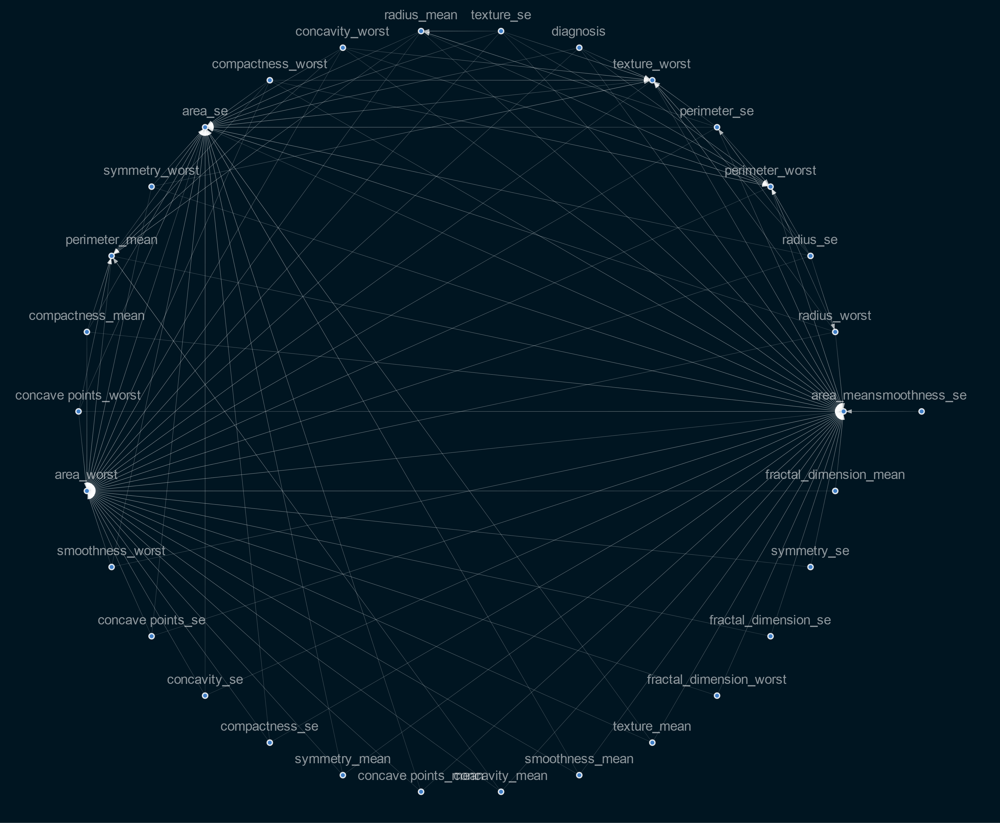

In [6]:
baseline_cg.show_graph(size=50, scale=0.8, prog="circo", image_name="all_cols_100_pct")

# Step-3: Create new causal graphs using increasing fractions of the data and compare with the ground truth graph


In [7]:
train_set_len = len(train_set)

### with 40%

In [8]:
fourty_pct = int(train_set_len * 0.4)
fourty_cg = CausalGraph(train_set.iloc[:fourty_pct, :])
# fourty_cg.learn_graph()
# fourty_cg.save_graph("1_causal_graph_with_fourty_pct.dot")
fourty_cg.read_graph("1_causal_graph_with_fourty_pct.dot")


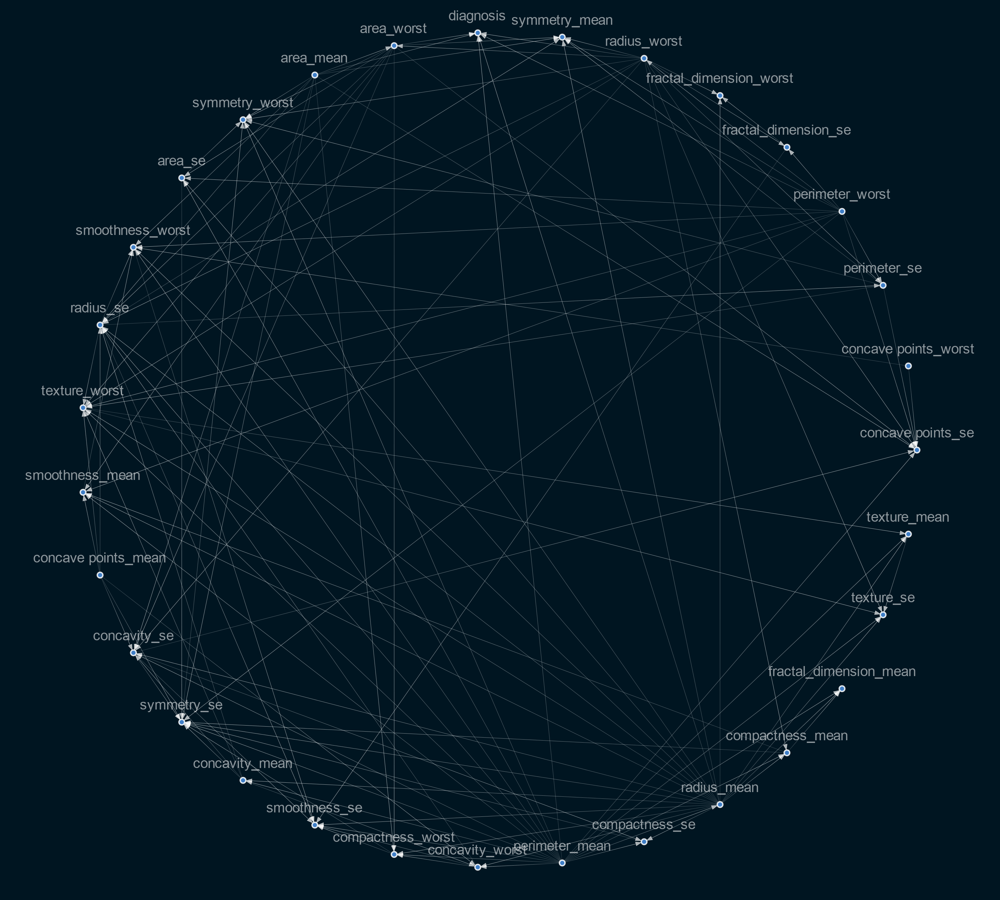

In [9]:
fourty_cg.show_graph(size=50, scale=0.8, prog="circo", image_name="all_cols_40_pct")

#### calculate difference with baseline graph

In [10]:
CausalGraph.jaccard_similarity(baseline_cg.sm.edges, fourty_cg.sm.edges)

0.036

### with 70%

In [11]:
seventy_pct = int(train_set_len * 0.7)
seventy_cg = CausalGraph(train_set.iloc[:seventy_pct, :])
# seventy_cg.learn_graph(w_threshold=0.8)
# seventy_cg.save_graph("2_causal_graph_with_seventy_pct.dot")
seventy_cg.read_graph("2_causal_graph_with_seventy_pct.dot")


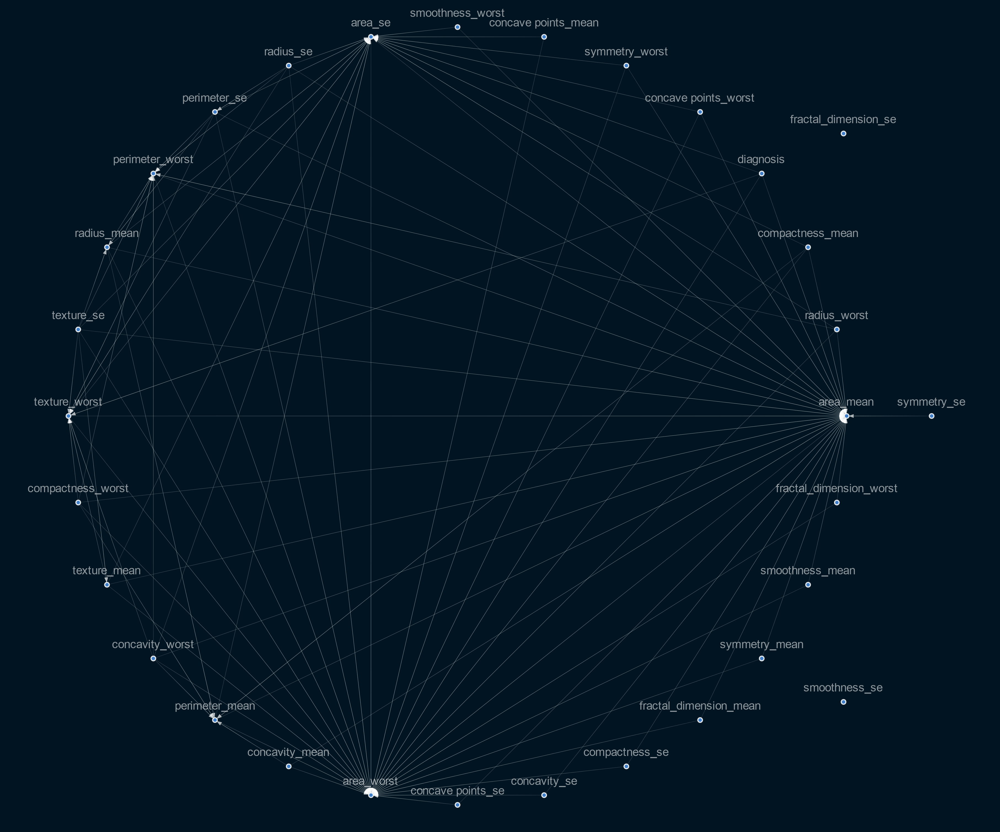

In [12]:
seventy_cg.show_graph(size=50, scale=0.8, prog="circo", image_name="all_cols_70_pct")

### calculate similarity with baseline graph

In [13]:
CausalGraph.jaccard_similarity(baseline_cg.sm.edges, seventy_cg.sm.edges)

0.813

### calculate similarity with fourty_pct graph

In [14]:
CausalGraph.jaccard_similarity(fourty_cg.sm.edges, seventy_cg.sm.edges)

0.033

## Draw using normalized dataset
Try after normalizing the data


### Baseline with normalized

In [15]:
train_set = cleaner.normal_scale(train_set)

In [16]:
baseline_cg_norm = CausalGraph(train_set)
# baseline_cg_norm.learn_graph(w_threshold=0.8)
# Save graph
# baseline_cg_norm.save_graph("baseline_norm.dot")
baseline_cg_norm.read_graph("baseline_norm.dot")

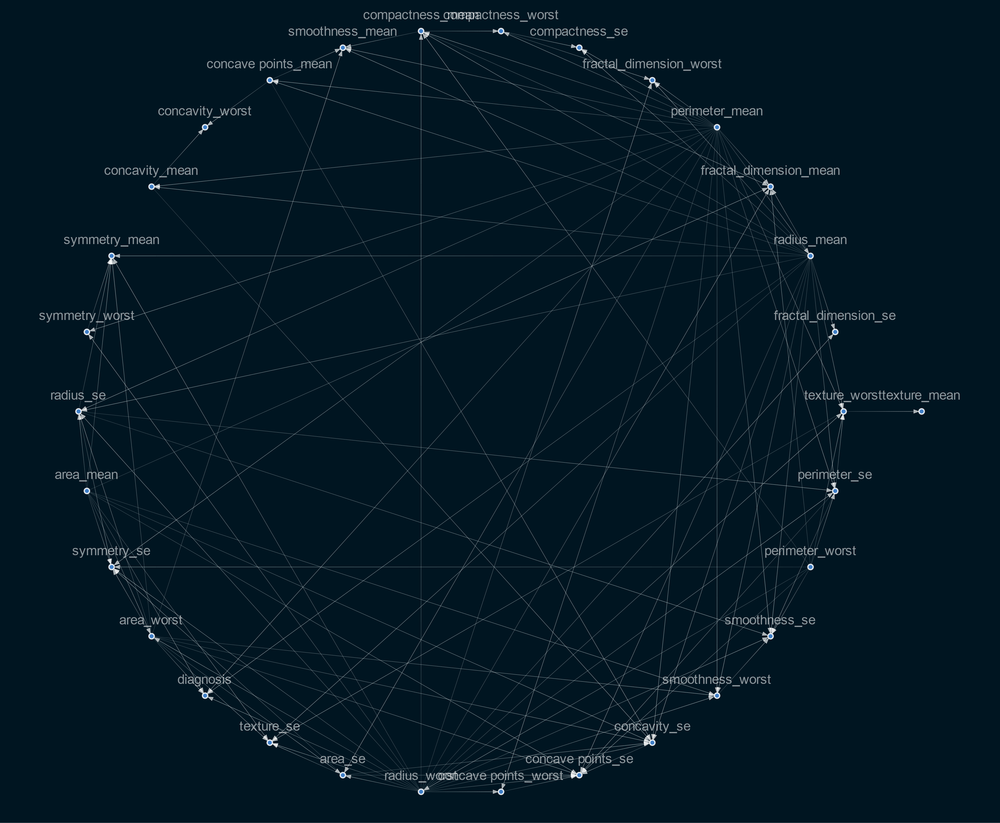

In [17]:
baseline_cg_norm.show_graph(size=50, scale=0.8, prog="circo", image_name="all_cols_100_pct_norm")

okay, atleast the lines not point to the `diagnosis` node

### 40% and normalized

In [18]:
fourty_pct = int(train_set_len * 0.4)
fourty_cg_norm = CausalGraph(train_set.iloc[:fourty_pct, :])
# fourty_cg_norm.learn_graph(w_threshold=0.8)
# fourty_cg_norm.save_graph("1_causal_graph_with_fourty_pct_norm.dot")
fourty_cg_norm.read_graph("1_causal_graph_with_fourty_pct_norm.dot")


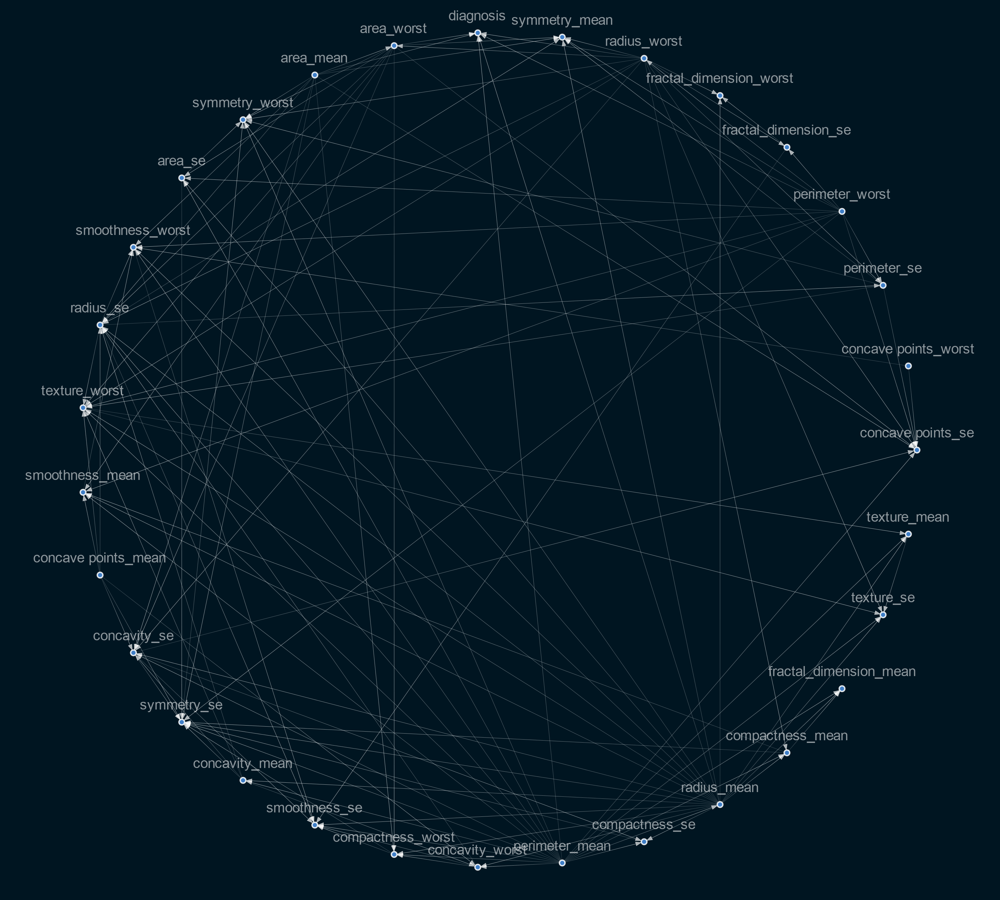

In [19]:
fourty_cg_norm.show_graph(size=50, scale=0.8, prog="circo", image_name="all_cols_40_pct_norm")

### 70% and normalized

In [20]:
seventy_pct = int(train_set_len * 0.7)
seventy_cg_norm = CausalGraph(train_set.iloc[:seventy_pct, :])
# seventy_cg_norm.learn_graph(w_threshold=0.8)
# seventy_cg_norm.save_graph("2_causal_graph_with_seventy_pct_norm.dot")
seventy_cg_norm.read_graph("2_causal_graph_with_seventy_pct_norm.dot")


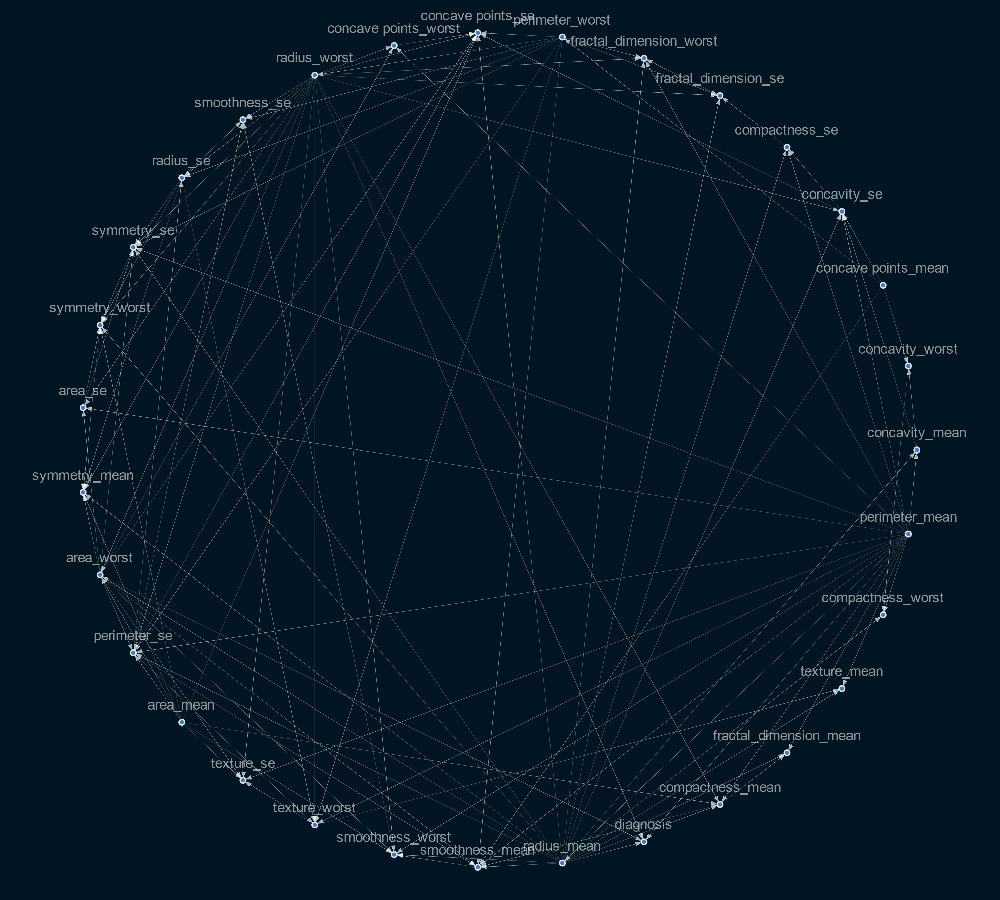

In [21]:
seventy_cg_norm.show_graph(size=50, scale=0.8, prog="circo", image_name="all_cols_70_pct_norm")

Now I will measure the similarity between each normalized graph



### IoU with jaccard similarity

In [22]:
print(f"IoU between baseline and with fourty % data: {CausalGraph.jaccard_similarity(baseline_cg_norm.sm.edges, fourty_cg_norm.sm.edges)}")
print(f"IoU between baseline and with seventy % data: {CausalGraph.jaccard_similarity(baseline_cg_norm.sm.edges, seventy_cg_norm.sm.edges)}")
print(f"IoU between fourty and with seventy % data: {CausalGraph.jaccard_similarity(fourty_cg_norm.sm.edges, seventy_cg_norm.sm.edges)}")

IoU between baseline and with fourty % data: 0.506
IoU between baseline and with seventy % data: 0.606
IoU between fourty and with seventy % data: 0.522


The above results tell me that the graph is not stable. This might be because the number of parameters is too large.
I will try keeping only a subset of the parametrs. I will start with only the ones that directly point to the traget variable.

# Step-4: After reaching a stable causal graph, select only variables that point directly to the target variable

I don't have a stable graph yet, but I am hoping reducing the variables would stabilize the graph.

In [23]:
cols_to_keep = [
    'diagnosis',
    'perimeter_mean',
    'radius_mean',
    'area_mean',
    'compactness_mean',

    'radius_worst',
    'area_worst',
    'perimeter_worst',
    
    'radius_se',
]
train_subset = train_set[cols_to_keep]

### Baseline with normalized and subseted

In [24]:
baseline_cg_norm_ss = CausalGraph(train_subset)
# baseline_cg_norm_ss.learn_graph(w_threshold=0.8)
# Save graph
# baseline_cg_norm_ss.save_graph("baseline_norm_with_subset.dot")
baseline_cg_norm_ss.read_graph("baseline_norm_with_subset.dot")

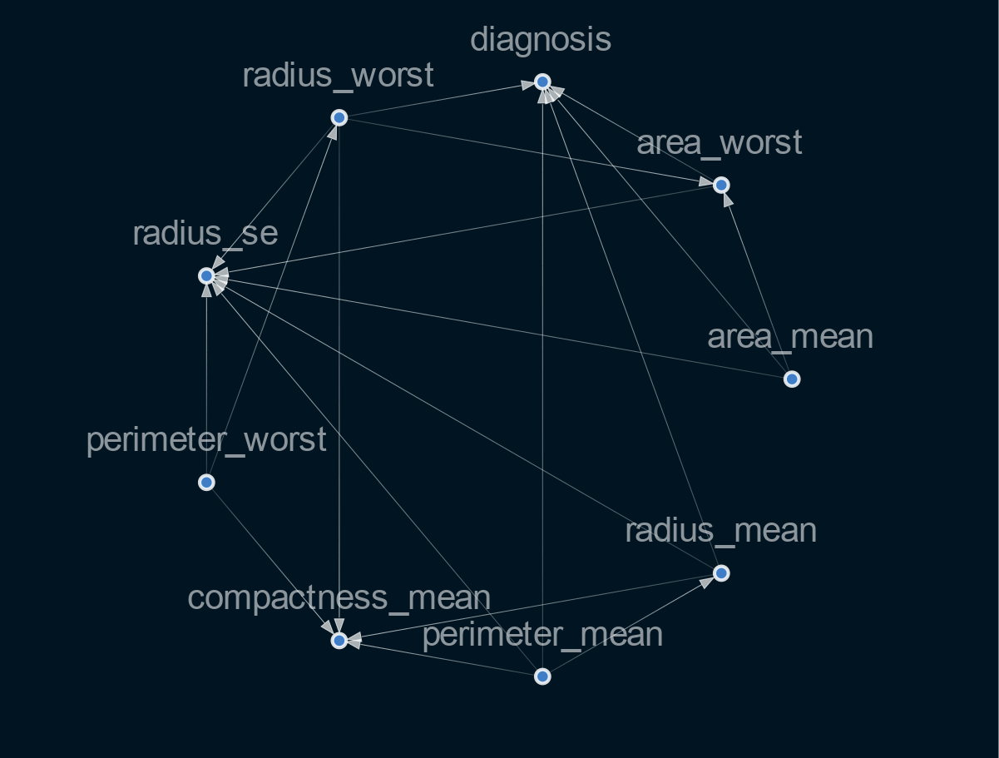

In [25]:
baseline_cg_norm_ss.show_graph(size=5, scale=0.8, prog="circo", image_name="all_cols_100_pct_norm_ss")

### 40% with normalized and subsetted

In [26]:
fourty_pct = int(train_set_len * 0.4)
fourty_cg_norm_ss = CausalGraph(train_subset.iloc[:fourty_pct, :])
# fourty_cg_norm_ss.learn_graph()
# fourty_cg_norm_ss.save_graph("1_causal_graph_with_fourty_pct_norm_with_subset.dot")
fourty_cg_norm_ss.read_graph("1_causal_graph_with_fourty_pct_norm_with_subset.dot")


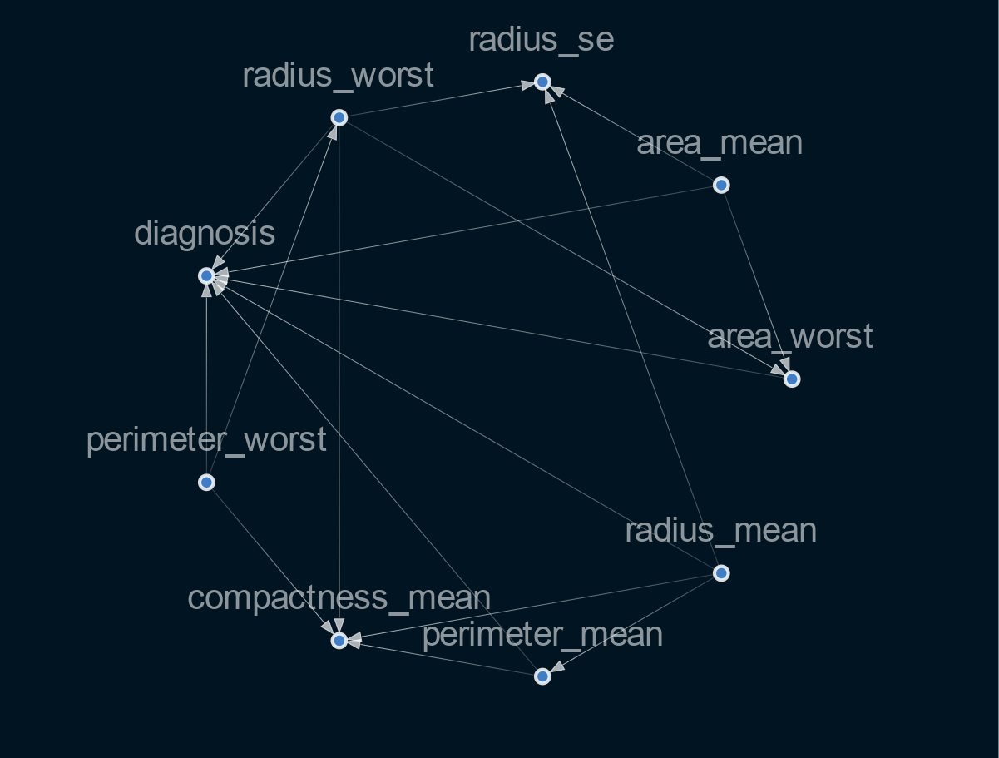

In [27]:
fourty_cg_norm_ss.show_graph(size=5, scale=0.8, prog="circo", image_name="all_cols_40_pct_norm_ss")

### 70% and normalized

In [28]:
seventy_pct = int(train_set_len * 0.7)
seventy_cg_norm_ss = CausalGraph(train_subset.iloc[:seventy_pct, :])
# seventy_cg_norm_ss.learn_graph(w_threshold=0.8)
# seventy_cg_norm_ss.save_graph("2_causal_graph_with_seventy_pct_norm_with_subset.dot")
seventy_cg_norm_ss.read_graph("2_causal_graph_with_seventy_pct_norm_with_subset.dot")


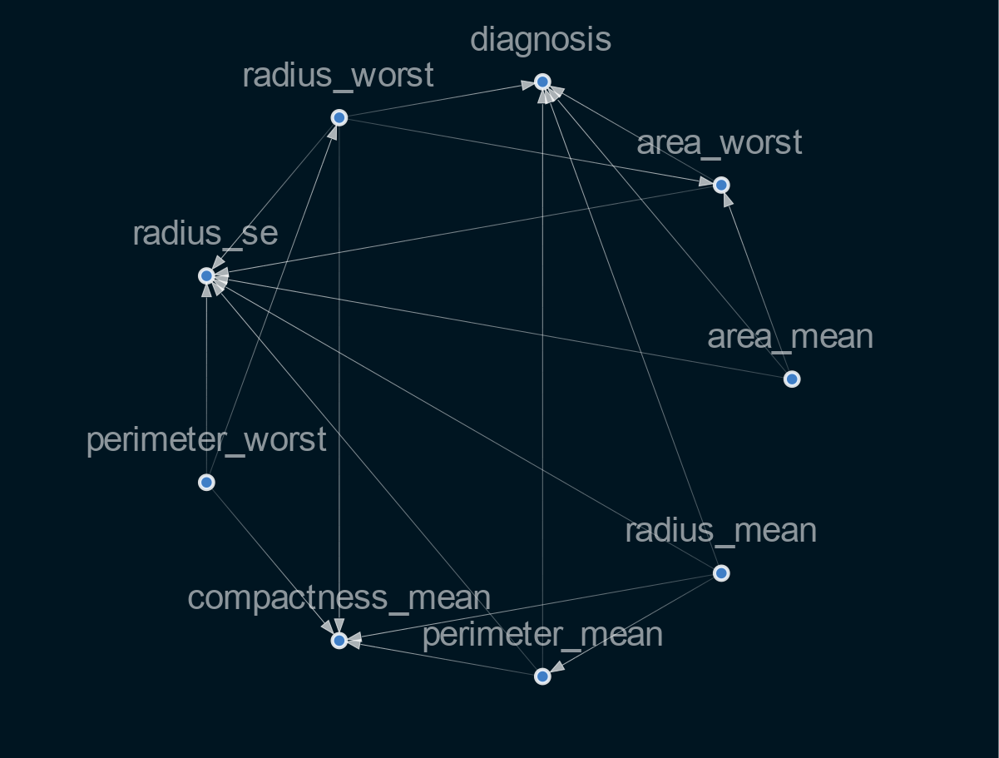

In [29]:
seventy_cg_norm_ss.show_graph(size=5, scale=0.8, prog="circo", image_name="all_cols_70_pct_norm_ss")

Now I will measure the similarity between each normalized graph



### IoU with jaccard similarity

In [30]:
print(f"IoU between baseline and with fourty % data: {CausalGraph.jaccard_similarity(baseline_cg_norm_ss.sm.edges, fourty_cg_norm_ss.sm.edges)}")
print(f"IoU between baseline and with seventy % data: {CausalGraph.jaccard_similarity(baseline_cg_norm_ss.sm.edges, seventy_cg_norm_ss.sm.edges)}")
print(f"IoU between fourty and with seventy % data: {CausalGraph.jaccard_similarity(fourty_cg_norm_ss.sm.edges, seventy_cg_norm_ss.sm.edges)}")

IoU between baseline and with fourty % data: 0.714
IoU between baseline and with seventy % data: 0.9
IoU between fourty and with seventy % data: 0.8


The above results tell me that the graph is more stable than before.
Reducing the parameters has worked.

# Step-5: Train one model using all variables and another using only the variables selected by the graph

Since I will need to discretize the data, I will be reloading the dataset.

## Discretising Numeric Features

I am following the guidance of [this](https://medium.com/quantumblack/whats-new-in-causalnex-v0-10-67b16005e596) blog post

Let's keep a copy of the dataset. 

In [31]:
data = struct_data.copy()
data = cleaner.normal_scale(data)

In [32]:
from causalnex.discretiser.discretiser_strategy import (
    DecisionTreeSupervisedDiscretiserMethod,
)
features = list(data.columns)#.difference(['diagnosis']))
tree_discretiser = DecisionTreeSupervisedDiscretiserMethod(
    mode='single', 
    tree_params={'max_depth': 2, 'random_state': 27},
)
tree_discretiser.fit(
    feat_names=features, 
    dataframe=data, 
    target_continuous=True,
    target='diagnosis',
)

DecisionTreeSupervisedDiscretiserMethod(tree_params={'max_depth': 2,
                                                     'random_state': 27})

Object tree_discretiser has learned all thresholds for each of the input features in feat_names. We can now apply these thresholds to our data using the transform method:

In [33]:
for col in features:
    data[col] = tree_discretiser.transform(data[[col]])

data.head()

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,1,3,0,3,3,3,3,3,3,3,...,3,0,3,3,3,3,3,3,3,3
1,1,3,1,3,3,1,0,1,2,2,...,3,1,3,3,1,1,1,3,0,1
2,1,3,2,3,3,3,3,3,3,2,...,3,2,3,3,2,3,3,3,3,1
3,1,0,2,0,0,3,3,3,3,3,...,0,2,0,0,3,3,3,3,3,3
4,1,3,0,3,3,2,2,3,3,2,...,3,0,3,3,2,1,3,3,0,0


## Split the data again

In [34]:
train, test = train_test_split(data, test_size=0.3, random_state=50)
print(f"Train set shape: {train.shape}\nHoldout set shape: {test.shape}")

Train set shape: (398, 31)
Holdout set shape: (171, 31)


In [35]:
from causalnex.network import BayesianNetwork

baseline_bn = BayesianNetwork(baseline_cg_norm.sm)

In [36]:
baseline_bn = baseline_bn.fit_node_states(data)

### Learn the Conditional Probability Distribution of each Node (CPDs)

In [37]:
baseline_bn = baseline_bn.fit_cpds(train, method="BayesianEstimator", bayes_prior="K2")

### Model Quality

In [38]:
from causalnex.evaluation import classification_report

classification_report(baseline_bn, test, 'diagnosis')

{'diagnosis_0': {'precision': 0.9196428571428571,
  'recall': 0.9196428571428571,
  'f1-score': 0.9196428571428571,
  'support': 112},
 'diagnosis_1': {'precision': 0.847457627118644,
  'recall': 0.847457627118644,
  'f1-score': 0.847457627118644,
  'support': 59},
 'accuracy': 0.8947368421052632,
 'macro avg': {'precision': 0.8835502421307506,
  'recall': 0.8835502421307506,
  'f1-score': 0.8835502421307506,
  'support': 171},
 'weighted avg': {'precision': 0.8947368421052632,
  'recall': 0.8947368421052632,
  'f1-score': 0.8947368421052632,
  'support': 171}}

## Train the model with columns we selected using the graph

In [39]:
cols_to_keep

['diagnosis',
 'perimeter_mean',
 'radius_mean',
 'area_mean',
 'compactness_mean',
 'radius_worst',
 'area_worst',
 'perimeter_worst',
 'radius_se']

In [40]:
data_ss = data[cols_to_keep]
train_ss, test_ss = train_test_split(data_ss, test_size=0.3, random_state=50)
print(f"Train set shape: {train_ss.shape}\nHoldout set shape: {test_ss.shape}")
data_ss.head()

Train set shape: (398, 9)
Holdout set shape: (171, 9)


,diagnosis,perimeter_mean,radius_mean,area_mean,compactness_mean,radius_worst,area_worst,perimeter_worst,radius_se
0,1,3,3,3,3,3,3,3,3
1,1,3,3,3,0,3,3,3,2
2,1,3,3,3,3,3,3,3,3
3,1,0,0,0,3,0,0,0,2
4,1,3,3,3,2,3,3,3,3


In [41]:
baseline_bn_ss = BayesianNetwork(baseline_cg_norm_ss.sm)

baseline_bn_ss = baseline_bn_ss.fit_node_states(data_ss)

baseline_bn_ss = baseline_bn_ss.fit_cpds(train_ss, method="BayesianEstimator", bayes_prior="K2")

In [42]:
classification_report(baseline_bn_ss, test_ss, 'diagnosis')

{'diagnosis_0': {'precision': 0.9196428571428571,
  'recall': 0.9196428571428571,
  'f1-score': 0.9196428571428571,
  'support': 112},
 'diagnosis_1': {'precision': 0.847457627118644,
  'recall': 0.847457627118644,
  'f1-score': 0.847457627118644,
  'support': 59},
 'accuracy': 0.8947368421052632,
 'macro avg': {'precision': 0.8835502421307506,
  'recall': 0.8835502421307506,
  'f1-score': 0.8835502421307506,
  'support': 171},
 'weighted avg': {'precision': 0.8947368421052632,
  'recall': 0.8947368421052632,
  'f1-score': 0.8947368421052632,
  'support': 171}}